# 2.4 Descriptive Spatial Analysis

In this notebook we spatially analyze the taxi trip data provided by the city of chicago: https://data.cityofchicago.org/Transportation/Taxi-Trips-2024-/ajtu-isnz/about_data (downloaded on 05.05.2026).

### Data Requirements:

This notebook requires the following files: 

1. `tl_2010_17031_tract10.shp` — local path: `data/tl_2010_17031_tract10/tl_2010_17031_tract10.shp` — Sciebo path: `data_parquet/geometry/tl_2010_17031_tract10/tl_2010_17031_tract10.shp`

2. `01_05_trips_clean.parquet` — local path: `data/trips/01_05_trips_clean.parquet` — Sciebo path: `data_parquet/trips/01_05_trips_clean.parquet`

3. `Boundaries_Community_Areas_20260608.geojson` — local path: `data/geometry/Boundaries_Community_Areas_20260608.geojson` — Sciebo path: `data_parquet/geometry/Boundaries_Community_Areas_20260608.geojson`

Sample data is provided in the appropriate locations for testing purposes only. It will not produce meaningful results.

In [1]:
# # # # # # # # # # # # # # # # # # # # # #
#                                         #
# Import packages                         #
#                                         #
# # # # # # # # # # # # # # # # # # # # # #

import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LogNorm
import folium
from folium.plugins import HeatMap
import h3
from shapely.geometry import Polygon
import contextily as cx

# reset working dir
import os
from pathlib import Path

In [2]:
# # # # # # # # # # # # # # # # # # # # # #
#                                         #
# Reset working directory                 #
#                                         #
# # # # # # # # # # # # # # # # # # # # # #

import __main__
_nb = getattr(__main__, "__vsc_ipynb_file__", None) or os.environ.get("JPY_SESSION_NAME")
_start = Path(_nb).resolve().parent if _nb else Path.cwd()
os.chdir(next(p for p in [_start, *_start.parents] if (p / "pyproject.toml").exists()))
print(f"Working directory: {os.getcwd()}")

Working directory: C:\Users\Yannick Herrmann\Documents\Uni\AAA\AAA_Project\AAA_TA_2026


In [3]:
# # # # # # # # # # # # # # # # # # # # # #
#                                         #
# Check data                              #
#                                         #
# # # # # # # # # # # # # # # # # # # # # #

# Path relative to the root directory
if Path("data/trips/01_05_trips_clean.parquet").exists():
    trip_data = pd.read_parquet("data/trips/01_05_trips_clean.parquet")
else:
    trip_data = pd.read_parquet("data/samples/SAMPLE_01_05_trips_clean.parquet")

trip_data.head()
display(trip_data)

,trip_id,taxi_id,trip_start_timestamp,trip_end_timestamp,trip_seconds,trip_miles,pickup_community_area,dropoff_community_area,fare,tips,...,payment_type,company,pickup_centroid_latitude,pickup_centroid_longitude,dropoff_centroid_latitude,dropoff_centroid_longitude,pickup_h3_res6,dropoff_h3_res6,pickup_h3_res7,dropoff_h3_res7
0,0275e2d8147a31e1ce320c5fb15f9910563cafe1,84957c8960b674346784746bbc1d48cafff4976b162323...,2025-01-01 00:00:00,2025-01-01 00:15:00,758.0,2.93,8,8,9.75,0.00,...,Prcard,Flash Cab,41.899602,-87.633308,41.899602,-87.633308,862664c1fffffff,862664c17ffffff,872664cadffffff,872664c1cffffff
1,05aa05bf6f3ec476715fad9f706bd137e08e00b7,0cbf5c0f6aca3628d77c7b6fe89715757ed402a70b0f8b...,2025-01-01 00:00:00,2025-01-01 00:15:00,1233.0,13.66,76,6,35.00,8.10,...,Credit Card,Globe Taxi,41.980264,-87.913625,41.944227,-87.655998,86275934fffffff,862664c17ffffff,87275934cffffff,872664c12ffffff
2,17365c83264f028a307ac70308d770fe03bcbcae,c3f8e0b6712bf3ea80e75ddde065b0ed42aa530e8c40cb...,2025-01-01 00:00:00,2025-01-01 00:15:00,985.0,3.22,8,7,55.00,0.00,...,Cash,City Service,41.899602,-87.633308,41.922686,-87.649489,862664c1fffffff,862664c17ffffff,872664c1effffff,872664c12ffffff
3,1c629303d7f08492d97e13fabe6a0d1d81e6c9c5,c8f57a1150c210a9e6b3fcfb24c3d6d0a43d1879b4b979...,2025-01-01 00:00:00,2025-01-01 00:15:00,652.0,3.24,22,7,11.67,4.00,...,Mobile,Tac - Yellow Cab Association,41.922761,-87.699155,41.922686,-87.649489,862664ca7ffffff,862664c17ffffff,872664ca1ffffff,872664c13ffffff
4,1cb48762978a475116ec833c0e4de8ed2ac88e14,88d8896a85cf755c4fb03711d495dc47ca8109196cdef6...,2025-01-01 00:00:00,2025-01-01 00:15:00,803.0,6.09,8,3,17.50,0.00,...,Cash,City Service,41.899602,-87.633308,41.965812,-87.655879,862664c1fffffff,862664c17ffffff,872664c1effffff,872664c16ffffff
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5369351,f0fce143dbea9334c1ceb9ae2b28f9ddeebfe49c,f0d6376865e19a2dae04d7d5401649247eb526372356ac...,2025-12-31 23:45:00,2026-01-01 00:00:00,659.0,2.02,32,33,11.10,0.00,...,Mobile,Taxicab Insurance Agency Llc,41.878866,-87.625192,41.857184,-87.620335,862664c1fffffff,862664c1fffffff,872664c1effffff,872664c1bffffff
5369352,f1f4fd1497483c42e0f597b0d4e23fef46512bd0,8ac81cfa2ee2c29b19f8fa21ed92b908d46bedc9d4055c...,2025-12-31 23:45:00,2025-12-31 23:45:00,480.0,1.10,32,32,6.75,0.00,...,Cash,Choice Taxi Association Inc,41.878866,-87.625192,41.878866,-87.625192,862664c1fffffff,862664c1fffffff,872664c1affffff,872664c1affffff
5369353,f25fea09e509dc84b861f98c47cb557701718ffd,54f9ba36584d6915e95cdf3394cdc46ed49c4a57cb0eb2...,2025-12-31 23:45:00,2026-01-01 00:00:00,632.0,3.59,32,33,12.50,0.00,...,Cash,Sun Taxi,41.878866,-87.625192,41.857184,-87.620335,862664c1fffffff,862664c1fffffff,872664c1affffff,872664cf4ffffff
5369354,f6181757bf371eb4d0480e052ed2723d58750bfc,17a313ad40ea410818634782c7202abda7ce5289dc03f9...,2025-12-31 23:45:00,2026-01-01 00:00:00,679.0,2.71,8,24,10.50,2.75,...,Mobile,Flash Cab,41.899602,-87.633308,41.901207,-87.676356,862664c17ffffff,862664cafffffff,872664c13ffffff,872664cacffffff


In [4]:
areas = gpd.read_file("data/geometry/Boundaries_Community_Areas_20260608.geojson").to_crs(3857)

areas

,:id,:version,:created_at,:updated_at,area_numbe,community,area_num_1,shape_area,shape_len,geometry
0,row-m77e_pkv8.vjvf,rv-3hjp_vkhx~fqfx,2025-04-22 23:06:36.944000+00:00,2025-04-22 23:06:36.944000+00:00,1,ROGERS PARK,1,51259902.4506,34052.3975757,"MULTIPOLYGON (((-9757660.529 5160704.746, -975..."
1,row-u375_347e-y6q8,rv-tgcx_t7fr-nkkg,2025-04-22 23:06:36.944000+00:00,2025-04-22 23:06:36.944000+00:00,2,WEST RIDGE,2,98429094.8621,43020.6894583,"MULTIPOLYGON (((-9761010.933 5163898.616, -976..."
2,row-kgqf-m29p-99kg,rv-bag4-8zri.nvhu,2025-04-22 23:06:36.944000+00:00,2025-04-22 23:06:36.944000+00:00,3,UPTOWN,3,65095642.7289,46972.7945549,"MULTIPOLYGON (((-9756154.198 5154211.526, -975..."
3,row-2dpv_pk9x-zybp,rv-82s2~rb54~emuc,2025-04-22 23:06:36.944000+00:00,2025-04-22 23:06:36.944000+00:00,4,LINCOLN SQUARE,4,71352328.2399,36624.6030848,"MULTIPOLYGON (((-9759870.406 5157400.522, -975..."
4,row-37zy.7r75.56p7,rv-hrse.ahu7-rz4d,2025-04-22 23:06:36.944000+00:00,2025-04-22 23:06:36.944000+00:00,5,NORTH CENTER,5,57054167.85,31391.6697542,"MULTIPOLYGON (((-9759754.254 5150850.097, -975..."
...,...,...,...,...,...,...,...,...,...,...
72,row-3uma_gs6v_expc,rv-cj4p_x3rj.brzz,2025-04-22 23:06:36.944000+00:00,2025-04-22 23:06:36.944000+00:00,73,WASHINGTON HEIGHTS,73,79635752.8769,42222.598163,"MULTIPOLYGON (((-9755342.627 5120449.037, -975..."
73,row-rn7j_sh22-jf8y,rv-a49v.s4vy~pudv,2025-04-22 23:06:36.944000+00:00,2025-04-22 23:06:36.944000+00:00,74,MOUNT GREENWOOD,74,75584290.0209,48665.1305392,"MULTIPOLYGON (((-9762325.229 5117211.619, -976..."
74,row-fiv3~fa4r~zk9e,rv-vip3.c98b.9m2d,2025-04-22 23:06:36.944000+00:00,2025-04-22 23:06:36.944000+00:00,75,MORGAN PARK,75,91877340.6988,46396.419362,"MULTIPOLYGON (((-9756279.738 5113922.382, -975..."
75,row-wewr.7jx4_gctv,rv-awj9_vhn6~tvpk,2025-04-22 23:06:36.944000+00:00,2025-04-22 23:06:36.944000+00:00,76,OHARE,76,371835607.687,173625.98466,"MULTIPOLYGON (((-9777923.456 5158941.865, -977..."


In [5]:
trip_data["start_hour"] = trip_data["trip_start_timestamp"].dt.hour

In [6]:
# Load census tract boundaries for choropleth maps
TRACT_COL = 'GEOID10'
tracts = gpd.read_file("data/geometry/tl_2010_17031_tract10/tl_2010_17031_tract10.shp").to_crs(3857)
tracts[TRACT_COL] = tracts[TRACT_COL].astype(str)
print(f"Census tracts loaded: {len(tracts)}")

Census tracts loaded: 1319


In [7]:
trip_data.info()

<class 'pandas.DataFrame'>
RangeIndex: 5369356 entries, 0 to 5369355
Data columns (total 24 columns):
 #   Column                      Dtype         
---  ------                      -----         
 0   trip_id                     str           
 1   taxi_id                     str           
 2   trip_start_timestamp        datetime64[ns]
 3   trip_end_timestamp          datetime64[ns]
 4   trip_seconds                float64       
 5   trip_miles                  float64       
 6   pickup_community_area       int64         
 7   dropoff_community_area      int64         
 8   fare                        float64       
 9   tips                        float64       
 10  tolls                       float64       
 11  extras                      float64       
 12  trip_total                  float64       
 13  payment_type                str           
 14  company                     str           
 15  pickup_centroid_latitude    float64       
 16  pickup_centroid_longitude   f

In [8]:
trip_data["pickup_community_area"] = trip_data["pickup_community_area"].astype(str)
trip_data["dropoff_community_area"] = trip_data["dropoff_community_area"].astype(str)

In [9]:
print(areas.columns.tolist())
print(areas.head(3))

[':id', ':version', ':created_at', ':updated_at', 'area_numbe', 'community', 'area_num_1', 'shape_area', 'shape_len', 'geometry']
                  :id           :version                      :created_at  \
0  row-m77e_pkv8.vjvf  rv-3hjp_vkhx~fqfx 2025-04-22 23:06:36.944000+00:00   
1  row-u375_347e-y6q8  rv-tgcx_t7fr-nkkg 2025-04-22 23:06:36.944000+00:00   
2  row-kgqf-m29p-99kg  rv-bag4-8zri.nvhu 2025-04-22 23:06:36.944000+00:00   

                       :updated_at area_numbe    community area_num_1  \
0 2025-04-22 23:06:36.944000+00:00          1  ROGERS PARK          1   
1 2025-04-22 23:06:36.944000+00:00          2   WEST RIDGE          2   
2 2025-04-22 23:06:36.944000+00:00          3       UPTOWN          3   

      shape_area      shape_len  \
0  51259902.4506  34052.3975757   
1  98429094.8621  43020.6894583   
2  65095642.7289  46972.7945549   

                                            geometry  
0  MULTIPOLYGON (((-9757660.529 5160704.746, -975...  
1  MULTIPOLYGON (

In [10]:
pd.DataFrame(trip_data.dtypes, columns=['Data Type'])

,Data Type
trip_id,str
taxi_id,str
trip_start_timestamp,datetime64[ns]
trip_end_timestamp,datetime64[ns]
trip_seconds,float64
trip_miles,float64
pickup_community_area,str
dropoff_community_area,str
fare,float64
tips,float64


## 2.4.1 Demand by spatial unit

The following maps compare taxi pickup and dropoff demand across spatial resolutions (community areas and H3 hexagons at different resolutions) to illustrate how the choice of spatial unit affects the visibility of demand patterns.

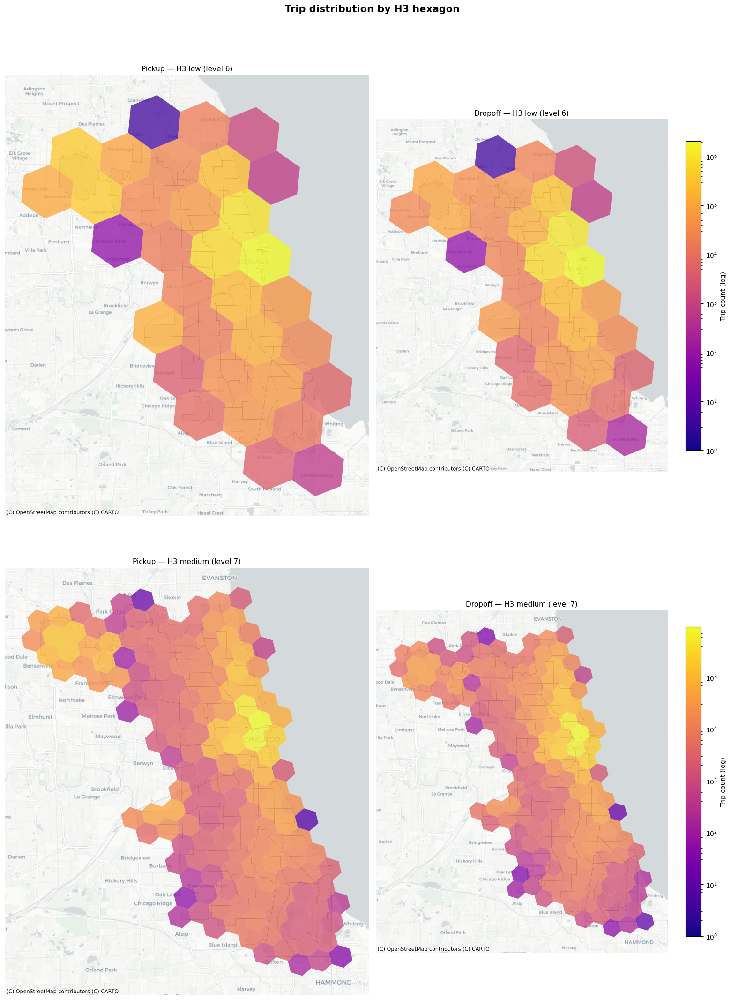

In [11]:
# Static H3 choropleth — all 3 resolutions, pickup and dropoff side by side
resolutions_plot = {'low': 6, 'medium': 7}
fig, axes = plt.subplots(2, 2, figsize=(16, 22))

for row_idx, (res_name, res_level) in enumerate(resolutions_plot.items()):
    for col_idx, direction in enumerate(('pickup', 'dropoff')):
        ax = axes[row_idx, col_idx]
        counts = trip_data[f'{direction}_h3_res{res_level}'].value_counts().dropna()
        polys = [
            Polygon([(lon, lat) for lat, lon in h3.cell_to_boundary(cell)])
            for cell in counts.index
        ]
        hex_gdf = gpd.GeoDataFrame({'count': counts.values, 'geometry': polys}, crs=4326).to_crs(3857)
        areas.plot(ax=ax, facecolor='lightgray', edgecolor='black', linewidth=0.4, alpha=0.4)
        hex_gdf.plot(
            ax=ax, column='count', cmap='plasma',
            norm=LogNorm(vmin=1, vmax=counts.max()),
            legend=(col_idx == 1),
            legend_kwds={'label': 'Trip count (log)', 'shrink': 0.6},
            alpha=0.75, edgecolor='none'
        )
        ax.set_title(f'{direction.capitalize()} — H3 {res_name} (level {res_level})', fontsize=11)
        ax.set_axis_off()
        cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)


plt.suptitle('Trip distribution by H3 hexagon', fontsize=15, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

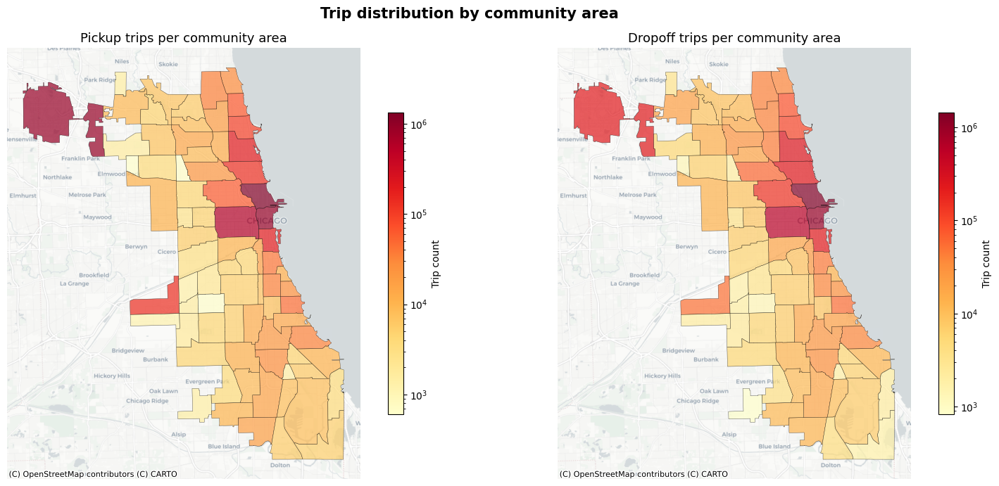

In [12]:
# Community Area choropleth — trip distribution across Chicago's community areas
pickup_ca  = trip_data['pickup_community_area'].value_counts().rename('count')
dropoff_ca = trip_data['dropoff_community_area'].value_counts().rename('count')

pickup_ca.index  = pickup_ca.index.map(lambda x: str(int(x)))
dropoff_ca.index = dropoff_ca.index.map(lambda x: str(int(x)))

fig, axes = plt.subplots(1, 2, figsize=(16, 7))
for ax, counts, title in zip(
    axes,
    [pickup_ca, dropoff_ca],
    ['Pickup trips per community area', 'Dropoff trips per community area']
):
    plot_gdf = areas.copy()
    plot_gdf['count'] = plot_gdf['area_numbe'].astype(str).map(counts).fillna(0).astype(int)
    plot_gdf.plot(
        ax=ax, column='count', cmap='YlOrRd',
        norm=LogNorm(vmin=max(1, plot_gdf['count'][plot_gdf['count'] > 0].min()),
                     vmax=plot_gdf['count'].max()),
        legend=True, legend_kwds={'label': 'Trip count', 'shrink': 0.7},
        edgecolor='black', linewidth=0.3, alpha = 0.7
    )
    ax.set_title(title, fontsize=13)
    ax.set_axis_off()
    cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)

plt.suptitle('Trip distribution by community area', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

## 2.4.2 Trip attributes by area

### Trip Fare and Miles

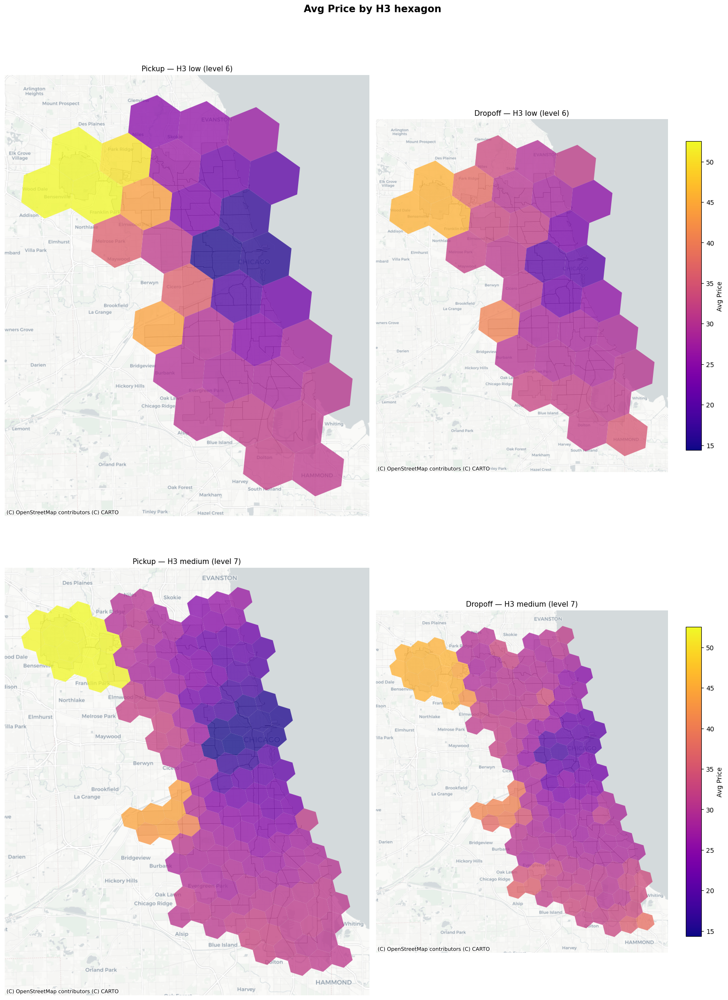

In [13]:
# Static H3 choropleth — all resolutions, pickup and dropoff side by side
resolutions_plot = {'low': 6, 'medium': 7}
fig, axes = plt.subplots(2, 2, figsize=(16, 22))

#calculate global scale 
global_min = min(
    trip_data.groupby(f'{d}_h3_res{r}')["trip_total"].mean().min()
    for r in resolutions_plot.values()
    for d in ('pickup', 'dropoff')
)
global_max = max(
    trip_data.groupby(f'{d}_h3_res{r}')["trip_total"].mean().max()
    for r in resolutions_plot.values()
    for d in ('pickup', 'dropoff')
)

for row_idx, (res_name, res_level) in enumerate(resolutions_plot.items()):
    for col_idx, direction in enumerate(('pickup', 'dropoff')):
        ax = axes[row_idx, col_idx]

        avg_price = trip_data.groupby(f'{direction}_h3_res{res_level}')["trip_total"].mean().reset_index()
        
        polys = [
            Polygon([(lon, lat) for lat, lon in h3.cell_to_boundary(cell)])
            for cell in avg_price[f'{direction}_h3_res{res_level}']
        ]
        hex_gdf = gpd.GeoDataFrame({'price': avg_price["trip_total"].values, 'geometry': polys}, crs=4326).to_crs(3857)
        areas.plot(ax=ax, facecolor='lightgray', edgecolor='black', linewidth=0.4, alpha=0.4)
        hex_gdf.plot(
            ax=ax, column='price', cmap='plasma',
            vmin=global_min,
            vmax=global_max,
            legend=(col_idx == 1),
            legend_kwds={'label': 'Avg Price', 'shrink': 0.6},
            alpha=0.75, edgecolor='none'
        )
        ax.set_title(f'{direction.capitalize()} — H3 {res_name} (level {res_level})', fontsize=11)
        ax.set_axis_off()
        cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)


plt.suptitle('Avg Price by H3 hexagon', fontsize=15, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

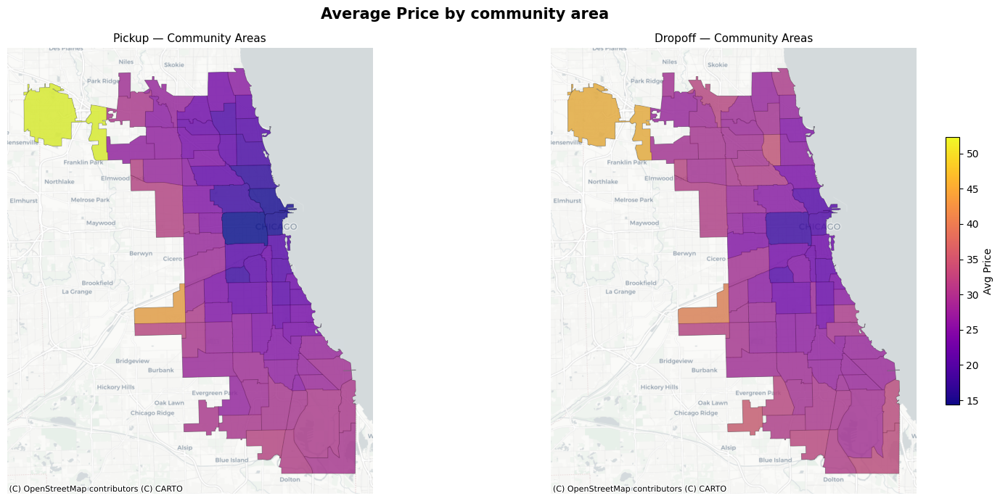

In [14]:
# Community Area choropleth — trip distribution across Chicago's community areas


#calculate global scale 
global_min = min(
    trip_data.groupby(f'{direction}_community_area')["trip_total"].mean().min()
    for direction in ('pickup', 'dropoff')
)
global_max = max(
    trip_data.groupby(f'{direction}_community_area')["trip_total"].mean().max()
    for direction in ('pickup', 'dropoff')
)

fig, axes = plt.subplots(1, 2, figsize=(16, 7))
for ax, direction in zip(axes, ('pickup', 'dropoff')):


    avg_price = trip_data.groupby(f'{direction}_community_area')["trip_total"].mean().reset_index()
        
    plot_gdf = gpd.GeoDataFrame(
        avg_price.merge(areas[['area_numbe', 'geometry']], left_on= f'{direction}_community_area', right_on='area_numbe', how='left'),
        geometry='geometry',
        crs=3857
    )
    
    areas.plot(ax=ax, edgecolor='black', linewidth=0.7, alpha=0.4)

    plot_gdf.plot(
        ax=ax, column='trip_total', cmap='plasma',
        vmin=global_min,
        vmax=global_max,
        legend=(direction == 'dropoff'),
        legend_kwds={'label': 'Avg Price', 'shrink': 0.6},
        alpha=0.75, edgecolor='none'
    )
    ax.set_title(f'{direction.capitalize()} — Community Areas', fontsize=11)
    ax.set_axis_off()
    cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)

    

plt.suptitle('Average Price by community area', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

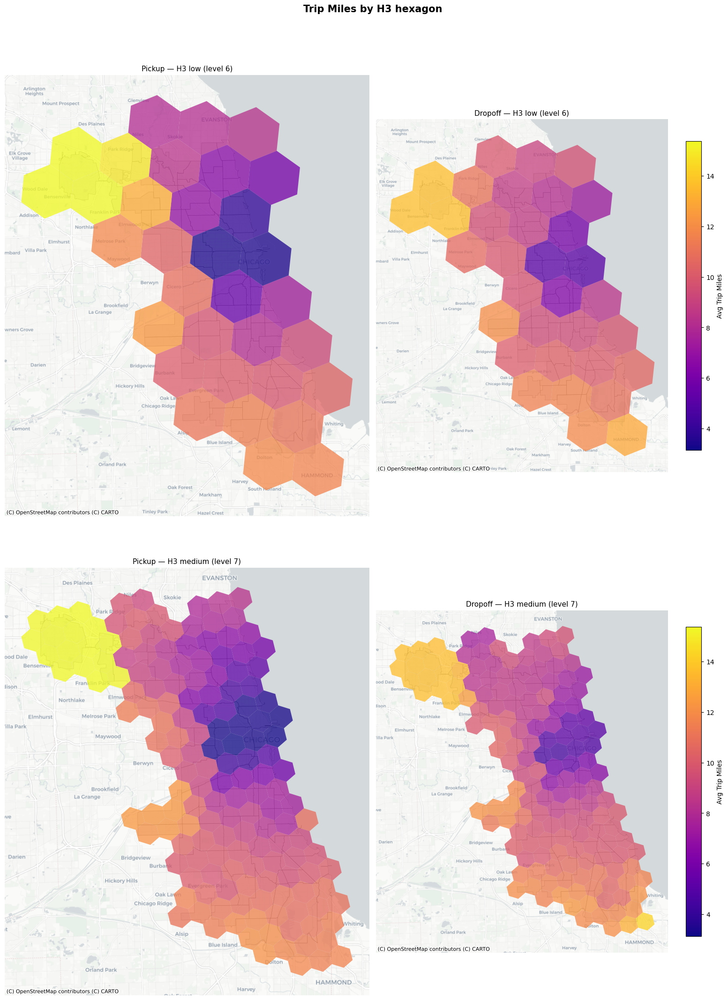

In [15]:
# Static H3 choropleth — all resolutions, pickup and dropoff side by side
resolutions_plot = {'low': 6, 'medium': 7}
fig, axes = plt.subplots(2, 2, figsize=(16, 22))

#calculate global scale 
global_min = min(
    
    trip_data.groupby(f'{d}_h3_res{r}')["trip_miles"].mean().min()
    for r in resolutions_plot.values()
    for d in ('pickup', 'dropoff')
)
global_max = max(
    trip_data.groupby(f'{d}_h3_res{r}')["trip_miles"].mean().max()
    for r in resolutions_plot.values()
    for d in ('pickup', 'dropoff')
)

for row_idx, (res_name, res_level) in enumerate(resolutions_plot.items()):
    for col_idx, direction in enumerate(('pickup', 'dropoff')):
        ax = axes[row_idx, col_idx]

        avg_trip_miles = trip_data.groupby(f'{direction}_h3_res{res_level}')["trip_miles"].mean().reset_index()
        
        polys = [
            Polygon([(lon, lat) for lat, lon in h3.cell_to_boundary(cell)])
            for cell in avg_trip_miles[f'{direction}_h3_res{res_level}']
        ]
        hex_gdf = gpd.GeoDataFrame({'trip_miles': avg_trip_miles["trip_miles"].values, 'geometry': polys}, crs=4326).to_crs(3857)
        areas.plot(ax=ax, facecolor='lightgray', edgecolor='black', linewidth=0.4, alpha=0.4)
        hex_gdf.plot(
            ax=ax, column='trip_miles', cmap='plasma',
            vmin=global_min,
            vmax=global_max,
            legend=(col_idx == 1),
            legend_kwds={'label': 'Avg Trip Miles', 'shrink': 0.6},
            alpha=0.75, edgecolor='none'
        )
        ax.set_title(f'{direction.capitalize()} — H3 {res_name} (level {res_level})', fontsize=11)
        ax.set_axis_off()
        cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)


plt.suptitle('Trip Miles by H3 hexagon', fontsize=15, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

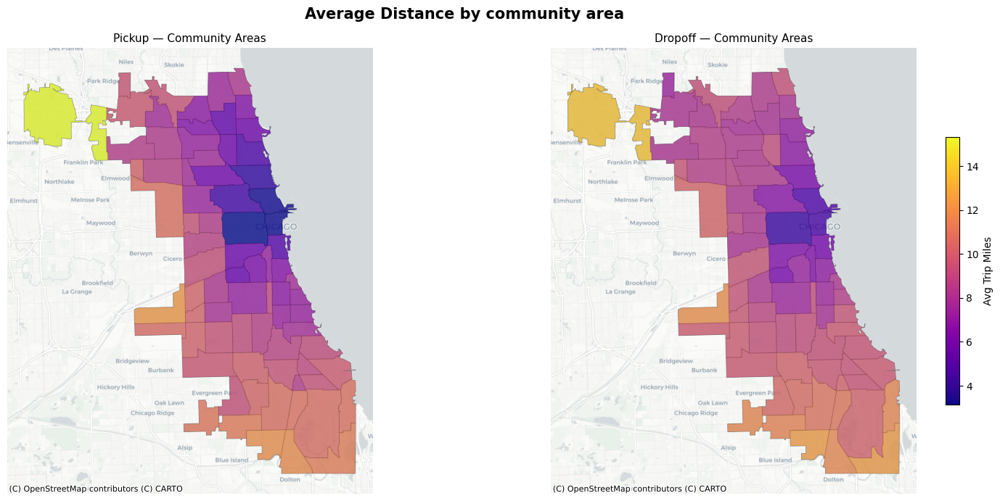

In [16]:
# Community Area choropleth — trip distribution across Chicago's community areas


#calculate global scale 
global_min = min(
    trip_data.groupby(f'{direction}_community_area')["trip_miles"].mean().min()
    for direction in ('pickup', 'dropoff')
)
global_max = max(
    trip_data.groupby(f'{direction}_community_area')["trip_miles"].mean().max()
    for direction in ('pickup', 'dropoff')
)

fig, axes = plt.subplots(1, 2, figsize=(16, 7))
for ax, direction in zip(axes, ('pickup', 'dropoff')):


    avg_miles = trip_data.groupby(f'{direction}_community_area')["trip_miles"].mean().reset_index()
        
    plot_gdf = gpd.GeoDataFrame(
        avg_miles.merge(areas[['area_numbe', 'geometry']], left_on= f'{direction}_community_area', right_on='area_numbe', how='left'),
        geometry='geometry',
        crs=3857
    )
    
    areas.plot(ax=ax, edgecolor='black', linewidth=0.7, alpha=0.4)

    plot_gdf.plot(
        ax=ax, column='trip_miles', cmap='plasma',
        vmin=global_min,
        vmax=global_max,
        legend=(direction == 'dropoff'),
        legend_kwds={'label': 'Avg Trip Miles', 'shrink': 0.6},
        alpha=0.75, edgecolor='none'
    )
    ax.set_title(f'{direction.capitalize()} — Community Areas', fontsize=11)
    ax.set_axis_off()
    cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)

    

plt.suptitle('Average Distance by community area', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

#### Interpretation

Average trip distance and price show an extremely similar pattern, which is to be expected. They are both highest for pickups at O'Hare airport (northwest), which makes intuitive sense, since passengers flying into Chicago are typically traveling to hotels, offices, or residences spread across the city, resulting in long trips. Midway in the southwest shows a similar but less pronounced effect.
The downtown core shows consistently short pickup distances and lower prices, reflecting short urban trips between nearby destinations within the city center. This contrast between airport and downtown is more pronounced in the pickup maps than the dropoff maps.

### Trip Duration 

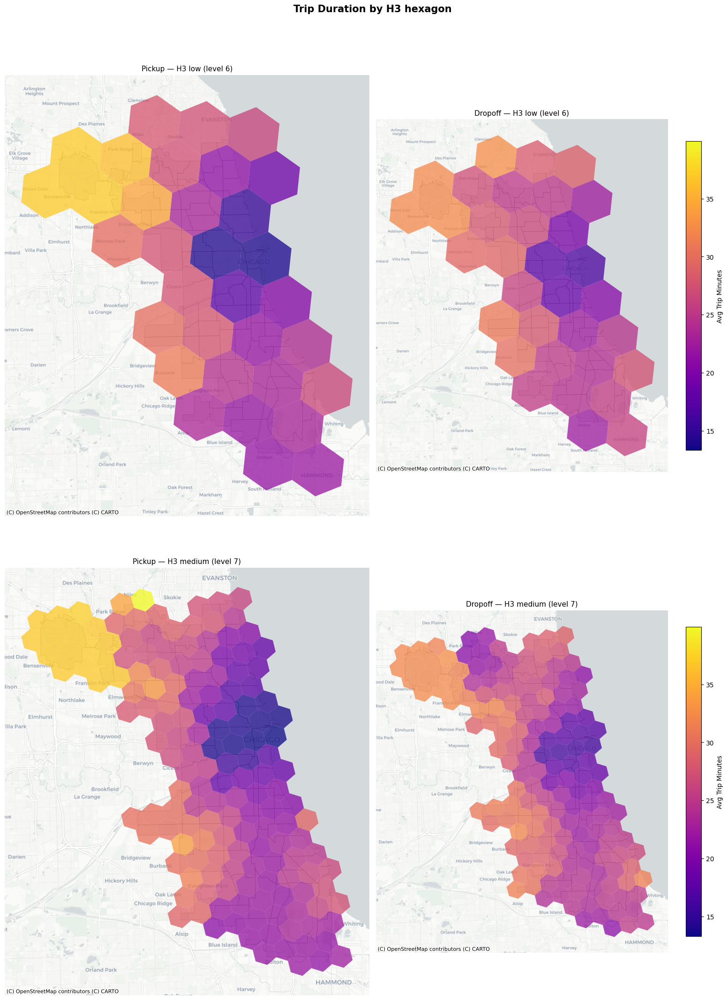

In [17]:
# create new attribute for trip duration in minutes
trip_data['trip_minutes'] = trip_data['trip_seconds'] / 60

# Static H3 choropleth — all resolutions, pickup and dropoff side by side
resolutions_plot = {'low': 6, 'medium': 7}
fig, axes = plt.subplots(2, 2, figsize=(16, 22))

#calculate global scale 
global_min = min(
    
    trip_data.groupby(f'{d}_h3_res{r}')["trip_minutes"].mean().min()
    for r in resolutions_plot.values()
    for d in ('pickup', 'dropoff')
)
global_max = max(
    trip_data.groupby(f'{d}_h3_res{r}')["trip_minutes"].mean().max()
    for r in resolutions_plot.values()
    for d in ('pickup', 'dropoff')
)

for row_idx, (res_name, res_level) in enumerate(resolutions_plot.items()):
    for col_idx, direction in enumerate(('pickup', 'dropoff')):
        ax = axes[row_idx, col_idx]

        avg_trip_duration = trip_data.groupby(f'{direction}_h3_res{res_level}')["trip_minutes"].mean().reset_index()
        
        polys = [
            Polygon([(lon, lat) for lat, lon in h3.cell_to_boundary(cell)])
            for cell in avg_trip_duration[f'{direction}_h3_res{res_level}']
        ]
        hex_gdf = gpd.GeoDataFrame({'trip_minutes': avg_trip_duration["trip_minutes"].values, 'geometry': polys}, crs=4326).to_crs(3857)
        areas.plot(ax=ax, facecolor='lightgray', edgecolor='black', linewidth=0.4, alpha=0.4)
        hex_gdf.plot(
            ax=ax, column='trip_minutes', cmap='plasma',
            vmin=global_min,
            vmax=global_max,
            legend=(col_idx == 1),
            legend_kwds={'label': 'Avg Trip Minutes', 'shrink': 0.6},
            alpha=0.75, edgecolor='none'
        )
        ax.set_title(f'{direction.capitalize()} — H3 {res_name} (level {res_level})', fontsize=11)
        ax.set_axis_off()
        cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)


plt.suptitle('Trip Duration by H3 hexagon', fontsize=15, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

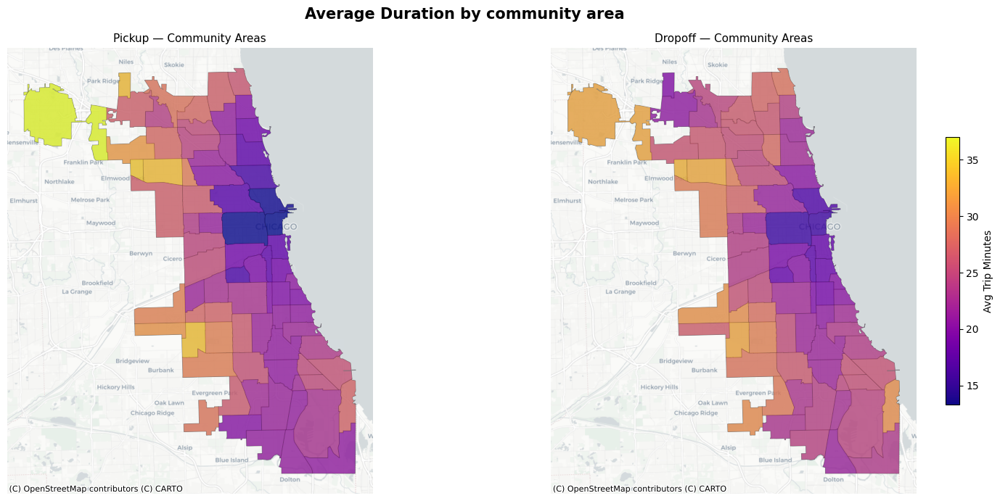

In [23]:
# Community Area choropleth — trip distribution across Chicago's community areas


#calculate global scale 
global_min = min(
    trip_data.groupby(f'{direction}_community_area')["trip_minutes"].mean().min()
    for direction in ('pickup', 'dropoff')
)
global_max = max(
    trip_data.groupby(f'{direction}_community_area')["trip_minutes"].mean().max()
    for direction in ('pickup', 'dropoff')
)

fig, axes = plt.subplots(1, 2, figsize=(16, 7))
for ax, direction in zip(axes, ('pickup', 'dropoff')):


    avg_duration = trip_data.groupby(f'{direction}_community_area')["trip_minutes"].mean().reset_index()
        
    plot_gdf = gpd.GeoDataFrame(
        avg_duration.merge(areas[['area_numbe', 'geometry']], left_on= f'{direction}_community_area', right_on='area_numbe', how='left'),
        geometry='geometry',
        crs=3857
    )
    
    areas.plot(ax=ax, edgecolor='black', linewidth=0.7, alpha=0.4)

    plot_gdf.plot(
        ax=ax, column='trip_minutes', cmap='plasma',
        vmin=global_min,
        vmax=global_max,
        legend=(direction == 'dropoff'),
        legend_kwds={'label': 'Avg Trip Minutes', 'shrink': 0.6},
        alpha=0.75, edgecolor='none'
    )
    ax.set_title(f'{direction.capitalize()} — Community Areas', fontsize=11)
    ax.set_axis_off()
    cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)

    

plt.suptitle('Average Duration by community area', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

#### Interpretation

The pattern is similar to the Distance Pattern. Trips that start at the two Airports take the longest while trips, that start in the downtown Area are consistently shorter trips. The dropoff map shows roughly the same pattern, just slightly less extreme. 

### Start Hour

In [ ]:
# since start hour is circular in reality, just taking the average wouldnt work. The average of 23 and 01 should be 00 but would be something like 12.
# that is why we define a circular mean, which takes this into account

def circular_mean_hour(hours):
    angles = 2 * np.pi * hours / 24
    mean_angle = np.arctan2(np.sin(angles).mean(), np.cos(angles).mean())
    mean_hour = mean_angle * 24 / (2 * np.pi) % 24
    return mean_hour

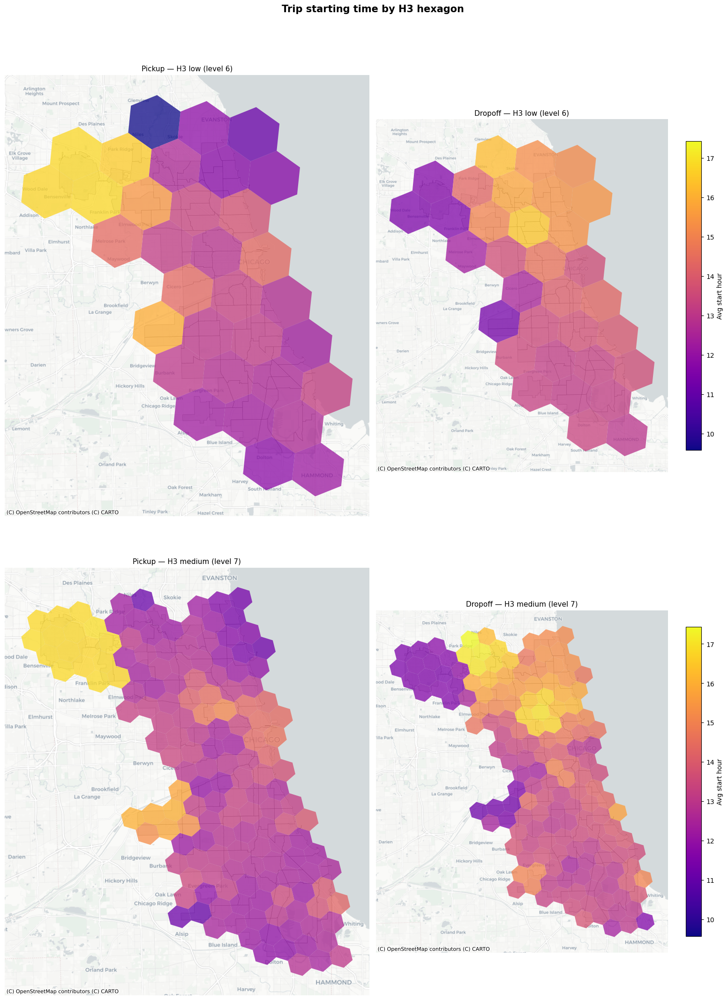

In [28]:
# Static H3 choropleth — all resolutions, pickup and dropoff side by side
resolutions_plot = {'low': 6, 'medium': 7}
fig, axes = plt.subplots(2, 2, figsize=(16, 22))

#calculate global scale 
global_min = min(
    
    trip_data.groupby(f'{d}_h3_res{r}')["start_hour"].apply(circular_mean_hour).min()
    for r in resolutions_plot.values()
    for d in ('pickup', 'dropoff')
)
global_max = max(
    trip_data.groupby(f'{d}_h3_res{r}')["start_hour"].apply(circular_mean_hour).max()
    for r in resolutions_plot.values()
    for d in ('pickup', 'dropoff')
)

for row_idx, (res_name, res_level) in enumerate(resolutions_plot.items()):
    for col_idx, direction in enumerate(('pickup', 'dropoff')):
        ax = axes[row_idx, col_idx]

        avg_starting_time = trip_data.groupby(f'{direction}_h3_res{res_level}')["start_hour"].apply(circular_mean_hour).reset_index()
        
        polys = [
            Polygon([(lon, lat) for lat, lon in h3.cell_to_boundary(cell)])
            for cell in avg_starting_time[f'{direction}_h3_res{res_level}']
        ]
        hex_gdf = gpd.GeoDataFrame({'start_hour': avg_starting_time["start_hour"].values, 'geometry': polys}, crs=4326).to_crs(3857)
        areas.plot(ax=ax, facecolor='lightgray', edgecolor='black', linewidth=0.4, alpha=0.4)
        hex_gdf.plot(
            ax=ax, column='start_hour', cmap='plasma',
            vmin=global_min,
            vmax=global_max,
            legend=(col_idx == 1),
            legend_kwds={'label': 'Avg start hour', 'shrink': 0.6},
            alpha=0.75, edgecolor='none'
        )
        ax.set_title(f'{direction.capitalize()} — H3 {res_name} (level {res_level})', fontsize=11)
        ax.set_axis_off()
        cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)


plt.suptitle('Trip starting time by H3 hexagon', fontsize=15, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

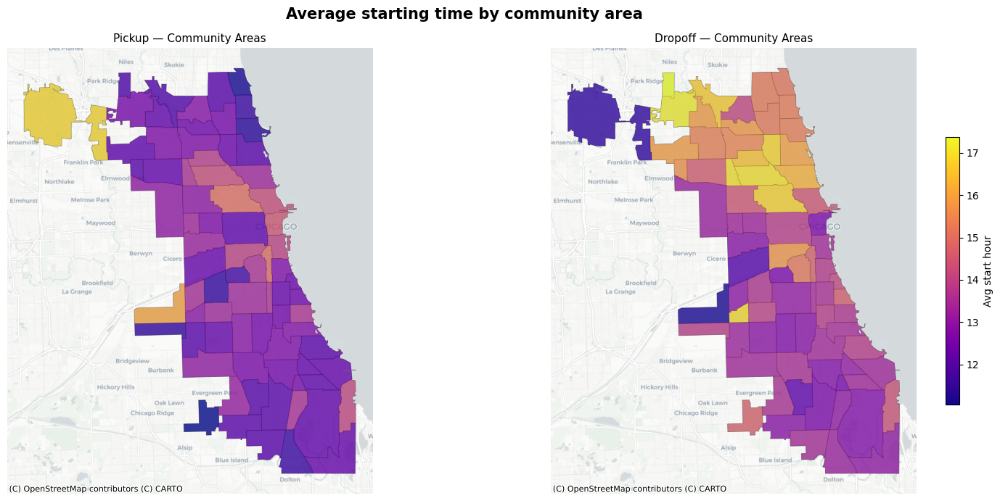

In [29]:
# Community Area choropleth — trip distribution across Chicago's community areas


#calculate global scale 
global_min = min(
    trip_data.groupby(f'{direction}_community_area')["start_hour"].apply(circular_mean_hour).min()
    for direction in ('pickup', 'dropoff')
)
global_max = max(
    trip_data.groupby(f'{direction}_community_area')["start_hour"].apply(circular_mean_hour).max()
    for direction in ('pickup', 'dropoff')
)

fig, axes = plt.subplots(1, 2, figsize=(16, 7))
for ax, direction in zip(axes, ('pickup', 'dropoff')):


    avg_starting_time = trip_data.groupby(f'{direction}_community_area')["start_hour"].apply(circular_mean_hour).reset_index()
        
    plot_gdf = gpd.GeoDataFrame(
        avg_starting_time.merge(areas[['area_numbe', 'geometry']], left_on= f'{direction}_community_area', right_on='area_numbe', how='left'),
        geometry='geometry',
        crs=3857
    )
    
    areas.plot(ax=ax, edgecolor='black', linewidth=0.7, alpha=0.4)

    plot_gdf.plot(
        ax=ax, column='start_hour', cmap='plasma',
        vmin=global_min,
        vmax=global_max,
        legend=(direction == 'dropoff'),
        legend_kwds={'label': 'Avg start hour', 'shrink': 0.6},
        alpha=0.75, edgecolor='none'
    )
    ax.set_title(f'{direction.capitalize()} — Community Areas', fontsize=11)
    ax.set_axis_off()
    cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)

    

plt.suptitle('Average starting time by community area', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

#### Interpretation

Again, the airports stand out. Trips starting at the airports tend to be later in the day while trips going toward the airports start very early. Additionally, it is interesting how the dropoff maps show clusters of late trips in the northern part of chicago, while such a pattern cannot be found in the pickup maps. A possible explanation for this is that the northern  part of chicago offers a high concentration of bars, restaurants, and entertainment venues, which arent as present in the south.

### Tip Rate

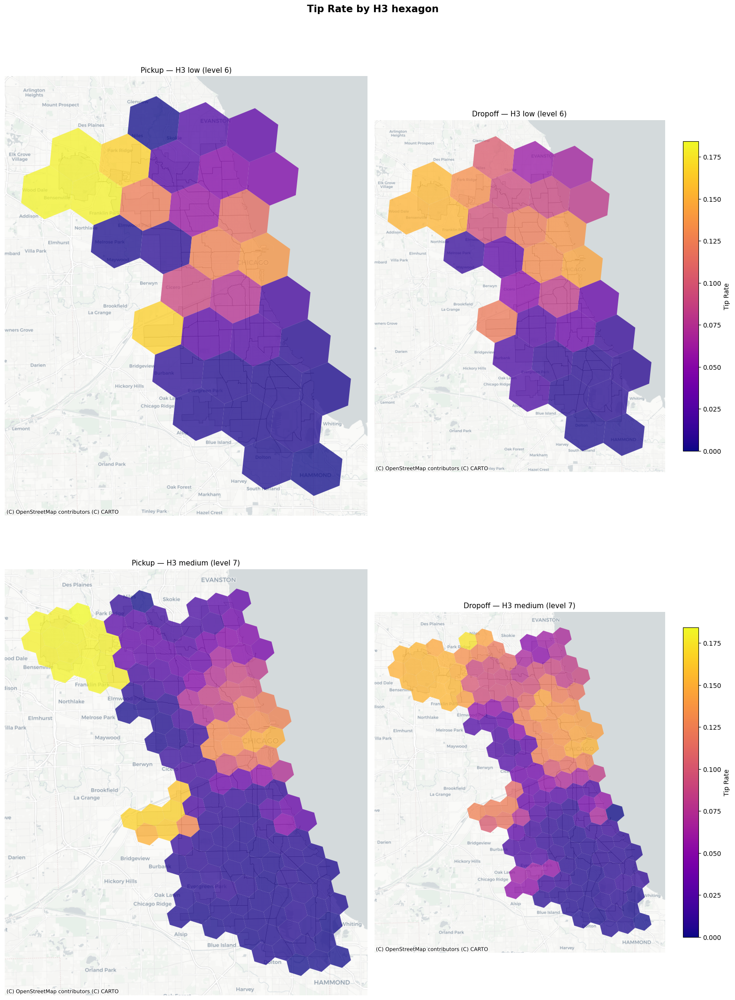

In [18]:
# Static H3 choropleth — all resolutions, pickup and dropoff side by side
resolutions_plot = {'low': 6, 'medium': 7}
fig, axes = plt.subplots(2, 2, figsize=(16, 22))

trip_data['tip_rate'] = trip_data['tips'] / trip_data['fare'].replace(0, np.nan)

#calculate global scale 
global_min = min(
    
    trip_data.groupby(f'{d}_h3_res{r}')["tip_rate"].mean().min()
    for r in resolutions_plot.values()
    for d in ('pickup', 'dropoff')
)
global_max = max(
    trip_data.groupby(f'{d}_h3_res{r}')["tip_rate"].mean().max()
    for r in resolutions_plot.values()
    for d in ('pickup', 'dropoff')
)

for row_idx, (res_name, res_level) in enumerate(resolutions_plot.items()):
    for col_idx, direction in enumerate(('pickup', 'dropoff')):
        ax = axes[row_idx, col_idx]

        avg_tip = trip_data.groupby(f'{direction}_h3_res{res_level}')["tip_rate"].mean().reset_index()
        
        polys = [
            Polygon([(lon, lat) for lat, lon in h3.cell_to_boundary(cell)])
            for cell in avg_tip[f'{direction}_h3_res{res_level}']
        ]
        hex_gdf = gpd.GeoDataFrame({'tip_rate': avg_tip["tip_rate"].values, 'geometry': polys}, crs=4326).to_crs(3857)
        areas.plot(ax=ax, facecolor='lightgray', edgecolor='black', linewidth=0.4, alpha=0.4)
        hex_gdf.plot(
            ax=ax, column='tip_rate', cmap='plasma',
            vmin=global_min,
            vmax=global_max,
            legend=(col_idx == 1),
            legend_kwds={'label': 'Tip Rate', 'shrink': 0.6},
            alpha=0.75, edgecolor='none'
        )
        ax.set_title(f'{direction.capitalize()} — H3 {res_name} (level {res_level})', fontsize=11)
        ax.set_axis_off()
        cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)


plt.suptitle('Tip Rate by H3 hexagon', fontsize=15, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

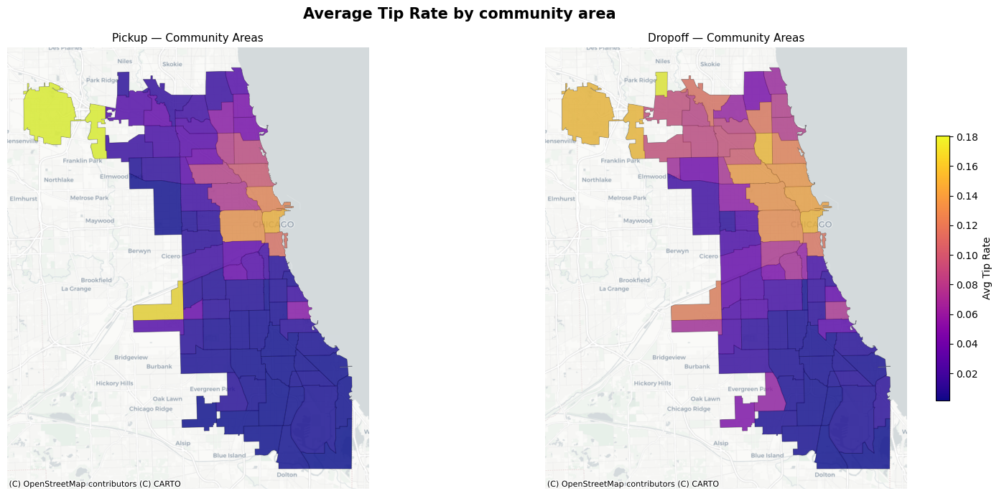

In [19]:
# Community Area choropleth — trip distribution across Chicago's community areas


#calculate global scale 
global_min = min(
    trip_data.groupby(f'{direction}_community_area')["tip_rate"].mean().min()
    for direction in ('pickup', 'dropoff')
)
global_max = max(
    trip_data.groupby(f'{direction}_community_area')["tip_rate"].mean().max()
    for direction in ('pickup', 'dropoff')
)

fig, axes = plt.subplots(1, 2, figsize=(16, 7))
for ax, direction in zip(axes, ('pickup', 'dropoff')):


    avg_tip = trip_data.groupby(f'{direction}_community_area')["tip_rate"].mean().reset_index()
        
    plot_gdf = gpd.GeoDataFrame(
        avg_tip.merge(areas[['area_numbe', 'geometry']], left_on= f'{direction}_community_area', right_on='area_numbe', how='left'),
        geometry='geometry',
        crs=3857
    )

    areas.plot(ax=ax, edgecolor='black', linewidth=0.7, alpha=0.4)

    plot_gdf.plot(
        ax=ax, column='tip_rate', cmap='plasma',
        vmin=global_min,
        vmax=global_max,
        legend=(direction == 'dropoff'),
        legend_kwds={'label': 'Avg Tip Rate', 'shrink': 0.6},
        alpha=0.75, edgecolor='none'
    )
    ax.set_title(f'{direction.capitalize()} — Community Areas', fontsize=11)
    ax.set_axis_off()
    cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)

    

plt.suptitle('Average Tip Rate by community area', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

#### Interpretation

Tip rate is highest for pickups at O'Hare (northwest), aligning with the trip distance finding. Airport passengers taking long trips tend to tip more generously, possibly because the fare is higher and tipping feels more expected for longer journeys. Midway airport shows a similar effect. Additionally, downtown shows an increased tip-rate. This reflects the demographic of passengers in that area, which include Tourists, business travelers, and higher-income residents who predominantly pay by card and tip more generously.

### Idle Time

In [20]:
print("Step 1: Converting timestamps to datetime objects...")
trip_data['trip_start_timestamp'] = pd.to_datetime(trip_data['trip_start_timestamp'])
trip_data['trip_end_timestamp'] = pd.to_datetime(trip_data['trip_end_timestamp'])

print("Step 2: Sorting dataset chronologically per taxi...")
trip_data = trip_data.sort_values(by=['taxi_id', 'trip_start_timestamp']).reset_index(drop=True)

print("Step 3: Finding the end time of each taxi's previous trip...")
trip_data['prev_trip_end'] = trip_data.groupby('taxi_id')['trip_end_timestamp'].shift(1)

print("Step 4: Calculating idle time in minutes...")
time_diff = trip_data['trip_start_timestamp'] - trip_data['prev_trip_end']
trip_data['idle_time_before_start'] = time_diff.dt.total_seconds() / 60.0

print("Step 5: Actively cleaning and fixing data anomalies...")

# Explicitly count and drop the first trip of every taxi since history is unknown
n_before_anomaly_a = len(trip_data)
trip_data = trip_data.dropna(subset=['idle_time_before_start']).reset_index(drop=True)
dropped_first_trips = n_before_anomaly_a - len(trip_data)

# Overlapping trips: force negative idle times to 0 minutes
overlap_count = (trip_data['idle_time_before_start'] < 0).sum()
trip_data.loc[trip_data['idle_time_before_start'] < 0, 'idle_time_before_start'] = 0

# Off-duty shifts: If a gap is > 2 hours, it's a break. Set to NaN so it doesn't pollute averages.
break_count = (trip_data['idle_time_before_start'] > 120).sum()
trip_data.loc[trip_data['idle_time_before_start'] > 120, 'idle_time_before_start'] = np.nan

print("Step 6: Dropping temporary columns to preserve RAM...")
trip_data = trip_data.drop(columns=['prev_trip_end'])

# --- Final Verification ---
missing_values = trip_data['idle_time_before_start'].isnull().sum()

print("\n Extraction & Cleaning Complete!")
print(f"-> Anomaly A Fixed: Dropped {dropped_first_trips} 'first trips' that had no prior history.")
print(f"-> Anomaly B Fixed: Corrected {overlap_count} overlapping trip timestamps to 0 minutes.")
print(f"-> Isolated {break_count} off-duty shifts as NaN to protect future averages.")

Step 1: Converting timestamps to datetime objects...
Step 2: Sorting dataset chronologically per taxi...
Step 3: Finding the end time of each taxi's previous trip...
Step 4: Calculating idle time in minutes...
Step 5: Actively cleaning and fixing data anomalies...
Step 6: Dropping temporary columns to preserve RAM...

 Extraction & Cleaning Complete!
-> Anomaly A Fixed: Dropped 3035 'first trips' that had no prior history.
-> Anomaly B Fixed: Corrected 51254 overlapping trip timestamps to 0 minutes.
-> Isolated 1317561 off-duty shifts as NaN to protect future averages.


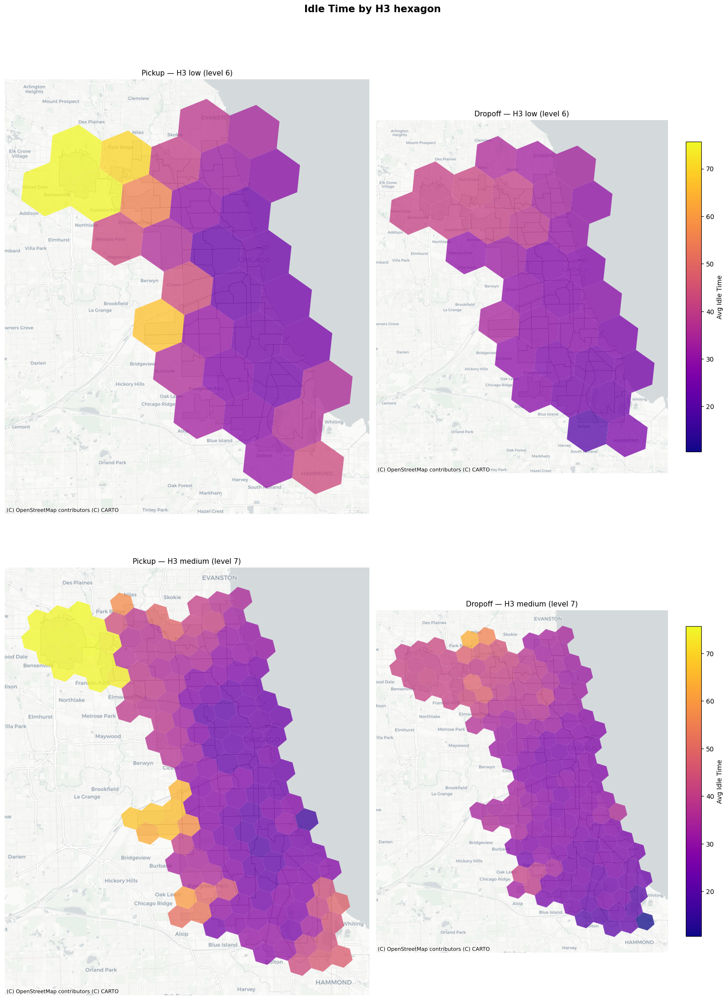

In [21]:
# Static H3 choropleth — all resolutions, pickup and dropoff side by side
resolutions_plot = {'low': 6, 'medium': 7}
fig, axes = plt.subplots(2, 2, figsize=(16, 22))

#calculate global scale 
global_min = min(
    
    trip_data.groupby(f'{d}_h3_res{r}')["idle_time_before_start"].mean().min()
    for r in resolutions_plot.values()
    for d in ('pickup', 'dropoff')
)
global_max = max(
    trip_data.groupby(f'{d}_h3_res{r}')["idle_time_before_start"].mean().max()
    for r in resolutions_plot.values()
    for d in ('pickup', 'dropoff')
)

for row_idx, (res_name, res_level) in enumerate(resolutions_plot.items()):
    for col_idx, direction in enumerate(('pickup', 'dropoff')):
        ax = axes[row_idx, col_idx]

        avg_idle_time = trip_data.groupby(f'{direction}_h3_res{res_level}')["idle_time_before_start"].mean().reset_index()
        
        polys = [
            Polygon([(lon, lat) for lat, lon in h3.cell_to_boundary(cell)])
            for cell in avg_idle_time[f'{direction}_h3_res{res_level}']
        ]
        hex_gdf = gpd.GeoDataFrame({'idle_time_before_start': avg_idle_time["idle_time_before_start"].values, 'geometry': polys}, crs=4326).to_crs(3857)
        areas.plot(ax=ax, facecolor='lightgray', edgecolor='black', linewidth=0.4, alpha=0.4)
        hex_gdf.plot(
            ax=ax, column='idle_time_before_start', cmap='plasma',
            vmin=global_min,
            vmax=global_max,
            legend=(col_idx == 1),
            legend_kwds={'label': 'Avg Idle Time', 'shrink': 0.6},
            alpha=0.75, edgecolor='none'
        )
        ax.set_title(f'{direction.capitalize()} — H3 {res_name} (level {res_level})', fontsize=11)
        ax.set_axis_off()
        cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)


plt.suptitle('Idle Time by H3 hexagon', fontsize=15, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

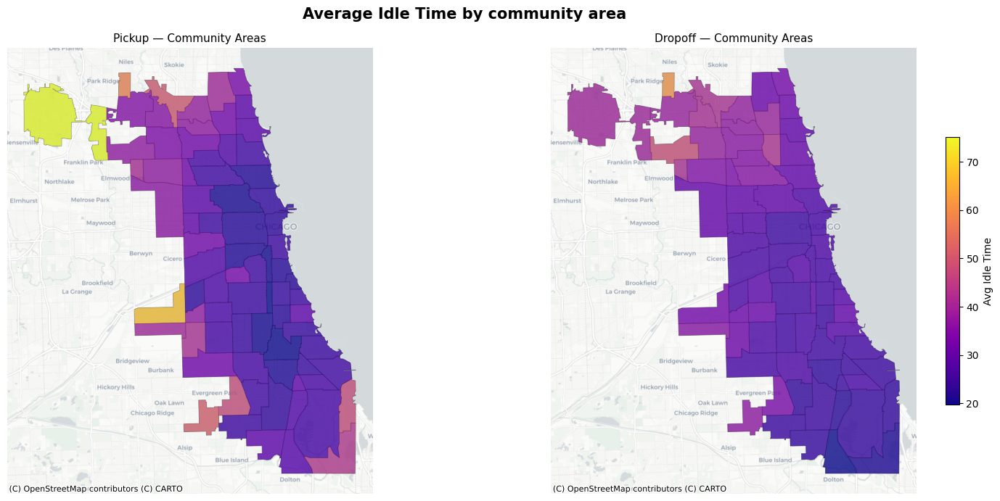

In [22]:
# Community Area choropleth — trip distribution across Chicago's community areas


#calculate global scale 
global_min = min(
    trip_data.groupby(f'{direction}_community_area')["idle_time_before_start"].mean().min()
    for direction in ('pickup', 'dropoff')
)
global_max = max(
    trip_data.groupby(f'{direction}_community_area')["idle_time_before_start"].mean().max()
    for direction in ('pickup', 'dropoff')
)

fig, axes = plt.subplots(1, 2, figsize=(16, 7))
for ax, direction in zip(axes, ('pickup', 'dropoff')):


    avg_idle_time = trip_data.groupby(f'{direction}_community_area')["idle_time_before_start"].mean().reset_index()
        
    plot_gdf = gpd.GeoDataFrame(
        avg_idle_time.merge(areas[['area_numbe', 'geometry']], left_on= f'{direction}_community_area', right_on='area_numbe', how='left'),
        geometry='geometry',
        crs=3857
    )

    areas.plot(ax=ax, edgecolor='black', linewidth=0.7, alpha=0.4)

    plot_gdf.plot(
        ax=ax, column='idle_time_before_start', cmap='plasma',
        vmin=global_min,
        vmax=global_max,
        legend=(direction == 'dropoff'),
        legend_kwds={'label': 'Avg Idle Time', 'shrink': 0.6},
        alpha=0.75, edgecolor='none'
    )
    ax.set_title(f'{direction.capitalize()} — Community Areas', fontsize=11)
    ax.set_axis_off()
    cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)

    

plt.suptitle('Average Idle Time by community area', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

#### Interpretation

Average idle time is highest around the two airports (O'Hare in the northwest, Midway in the southwest). This is largely a structural effect: airport pickups are regulated through designated taxi holding lots where drivers must queue and wait for dispatch, artificially inflating idle time compared to city street hailing where drivers can cruise actively. The dropoff maps show no comparable hotspots, which is expected. Drivers dropping off at the airport immediately join the holding queue, but passengers picked up at the airport are distributed across the entire city, so no single dropoff zone accumulates unusual idle time